# **Automated Garbage Classification Using Deep Learning**

## **Objective:**
### **Develop a robust deep learning model to classify different types of garbage, aiming to improve recycling efficiency and reduce environmental impact.**

## **Dataset**
**Source:** Custom Dataset

The dataset includes images of garbage categorized into seven types:
- `Paper`
- `Plastic`
- `Cardboard`
- `Glass`
- `Metal`
- `Biological waste`
- `E-waste`

## **Business Questions**
1. How can we accurately classify different types of garbage using deep learning?
2. How can we deploy the model for real-world applications?

## **Key Features**
- **Image data:** Various categories of garbage images.

## **Business Approach**

### **1. Data Loading and Exploration**
- Load the dataset and explore the structure and contents.

### **2. Data Preprocessing**
- Resize images.
- Normalize pixel values.

### **3. Model Building**
- Define the CNN model.
- Compile the model.

### **4. Model Training**
- Train the model using the training data.

### **5. Model Evaluation**
- Evaluate the model's performance on the validation data.
- Plot training and validation accuracy and loss.

### **6. Model Comparison**
- Compare different pre-trained models.
- Select the best-performing model.

### **7. Prediction and Confusion Matrix**
- Make predictions on the validation data.
- Generate and plot the confusion matrix.

### **8. Deployment**
- Save the trained model.
- Deploy the model to classify new images in a real-world application.

## **Conclusion**
- Summarize the findings and results.
- Discuss potential improvements.

## **Dataset1 Link:** https://www.kaggle.com/datasets/farzadnekouei/trash-type-image-dataset

## **Dataset2 Link:** https://www.kaggle.com/code/phyoezawaung/garbage-classification-pza/input

## **Importing Libraries**

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.colors import LinearSegmentedColormap
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.applications import VGG16
from tensorflow.keras.utils import plot_model
from sklearn.metrics import classification_report
import cv2
from google.colab.patches import cv2_imshow
from tensorflow.keras.preprocessing import image



from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3, DenseNet121, EfficientNetB0
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.utils import plot_model
from keras.layers import Input, Activation, Add

# **1. Data Loading and Exploration**

# Define the path to the dataset

In [ ]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
dataset_path = '/content/TrashType_Image_Dataset.zip'
extract_path = '/content/images'

# Unzip the dataset

In [ ]:
# Unzip the dataset
import zipfile
with zipfile.ZipFile(dataset_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# List all files and directories

In [ ]:
# List all files and directories to debug
print("Files and directories after extraction:")
for root, dirs, files in os.walk(extract_path):
    for name in dirs:
        print(os.path.join(root, name))
    for name in files:
        print(os.path.join(root, name))

Files and directories after extraction:
/content/images/__MACOSX
/content/images/TrashType_Image_Dataset
/content/images/__MACOSX/TrashType_Image_Dataset
/content/images/__MACOSX/._TrashType_Image_Dataset
/content/images/__MACOSX/TrashType_Image_Dataset/e-waste
/content/images/__MACOSX/TrashType_Image_Dataset/biological
/content/images/__MACOSX/TrashType_Image_Dataset/._.DS_Store
/content/images/__MACOSX/TrashType_Image_Dataset/._e-waste
/content/images/__MACOSX/TrashType_Image_Dataset/e-waste/._alaba-international-market-julius-paul-a-tv-repair-man-at-alaba-his-picture-id536200344.jpg
/content/images/__MACOSX/TrashType_Image_Dataset/e-waste/._general-rubbish-and-electronic-waste-in-olusosum-dump-site-in-lagos-B8YWWN.jpg
/content/images/__MACOSX/TrashType_Image_Dataset/e-waste/._electronic-devices-dumpsite-dump-site-e-waste-disposal-management-reuse-recycle-recovery-concept-consumerism-globalization-89078185.jpg
/content/images/__MACOSX/TrashType_Image_Dataset/e-waste/._image14.jpeg
/c

# **2. Data Preprocessing**

## Extract Categories Dynamically

In [ ]:
# Extract categories dynamically
dataset_base_path = os.path.join(extract_path, 'TrashType_Image_Dataset')
categories = os.listdir(dataset_base_path)

# Print categories to verify
print("Categories:", categories)

Categories: ['plastic', 'e-waste', 'cardboard', '.DS_Store', 'paper', 'glass', 'metal', 'biological']


In [ ]:
categories = [category for category in categories if category != '.DS_Store']

print("Filtered Categories:", categories)

Filtered Categories: ['plastic', 'e-waste', 'cardboard', 'paper', 'glass', 'metal', 'biological']


# Image count of each Category

In [ ]:
# Count the number of images in each category
image_counts = {}
for category in categories:
    category_path = os.path.join(dataset_base_path, category)
    if os.path.isdir(category_path):
        image_counts[category] = len(os.listdir(category_path))

# Print the category and number of images
for category, count in image_counts.items():
    print(f'Category: {category}, No_of_images: {count}')

Category: plastic, No_of_images: 482
Category: e-waste, No_of_images: 624
Category: cardboard, No_of_images: 403
Category: paper, No_of_images: 594
Category: glass, No_of_images: 501
Category: metal, No_of_images: 410
Category: biological, No_of_images: 642


In [ ]:
# Create a dictionary to hold the images and their labels
data = {category: [] for category in categories}

# Load images from each category into the dictionary
for category in categories:
    category_path = os.path.join(dataset_base_path, category)
    if os.path.isdir(category_path):
        images = os.listdir(category_path)
        data[category] = [os.path.join(category_path, img) for img in images]

# Print to verify
data

{'plastic': ['/content/images/TrashType_Image_Dataset/plastic/plastic_439.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_157.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_470.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_452.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_431.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_241.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_162.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_092.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_381.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_164.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_258.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_121.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_390.jpg',
  '/content/images/TrashType_Image_Dataset/plastic/plastic_245.jpg',
  '/content/images/Tras

# Function to plot multiple images from each category with headings

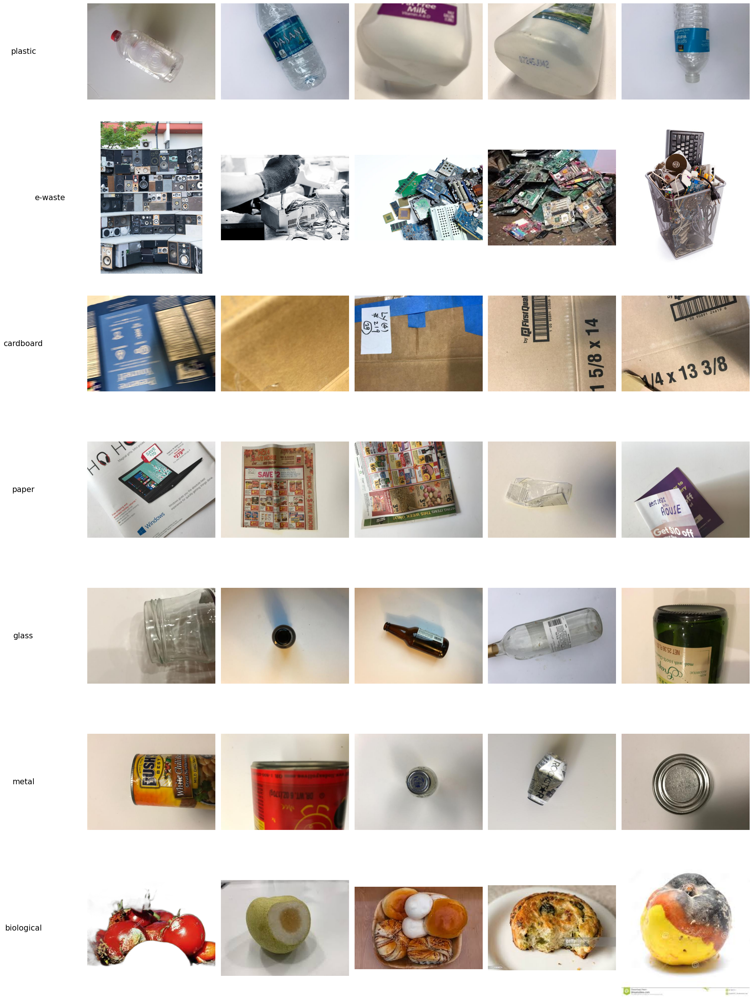

In [ ]:
# Function to plot multiple images from each category with headings
def plot_images_with_headings(data, num_images_per_category=5):
    categories = list(data.keys())
    total_images = num_images_per_category * len(categories)

    #Create a Figure for Plotting:
    plt.figure(figsize=(20, len(categories) * 4))

    for i, category in enumerate(categories):
        images = data[category][:num_images_per_category]

        # Add a title for each category row
        plt.subplot(len(categories), num_images_per_category, i * num_images_per_category + 1)
        plt.text(-0.5, 0.5, category, fontsize=15, ha='center', va='center', rotation=0, transform=plt.gca().transAxes)
        plt.axis('off')

        #Loop Through Each Image in the Category:
        for j, img_path in enumerate(images):
            plt.subplot(len(categories), num_images_per_category, i * num_images_per_category + j + 1)
            img = mpimg.imread(img_path)
            plt.imshow(img)
            plt.axis('off')

    plt.tight_layout()
    plt.show()

# Plot multiple images from each category
plot_images_with_headings(data, num_images_per_category=5)

## **Key Insights:**

* **Inconsistent Image Sizes:** The final dataset was created by merging two different datasets. The categories such as e-waste and biological were obtained from a separate dataset, which had images of varying sizes compared to the other categories, as visible in the image above.

* **Need for Resizing:** To ensure that all images could be uniformly processed by the model, a resizing step was necessary to standardize the dimensions across all categories, preparing them for consistent model training.

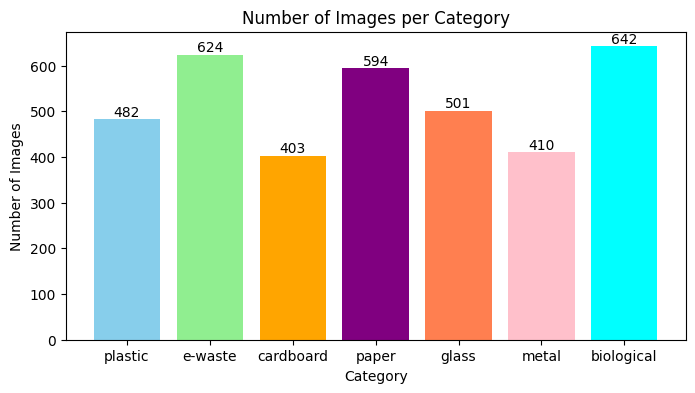

In [155]:
categories = list(image_counts.keys())
counts = list(image_counts.values())
colors = ['skyblue', 'lightgreen', 'orange', 'purple', 'coral', 'pink', 'cyan']

# Plotting the bar chart
plt.figure(figsize=(8, 4))
bars = plt.bar(categories, counts, color=colors)

# Adding text on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height}', ha='center', va='bottom')

plt.xlabel('Category')
plt.ylabel('Number of Images')
plt.title('Number of Images per Category')
plt.show()

## **Key Insights:**

1. **Biological:** Most frequent category with 642 images.
2. **E-waste:** Second highest with 624 images.
3. **Paper:** Third with 594 images.
4. **Glass:** Moderately represented with 501 images.
5. **Plastic:** Well-represented with 482 images.
6. **Metal:** Lower frequency with 410 images.
7. **Cardboard:** Least represented with 403 images.


# Define the base path


In [156]:
dataset_base_path = '/content/images/TrashType_Image_Dataset'

# Verify if the path exists
if not os.path.exists(dataset_base_path):
    print(f"Path does not exist: {dataset_base_path}")
else:
    print(f"Path exists: {dataset_base_path}")

# List all categories dynamically if the path exists
if os.path.exists(dataset_base_path):
    categories = [d for d in os.listdir(dataset_base_path) if os.path.isdir(os.path.join(dataset_base_path, d))]

    # Create a dictionary to hold the images and their labels
    data = {category: [] for category in categories}

    # Load images from each category into the dictionary
    for category in categories:
        category_path = os.path.join(dataset_base_path, category)
        if os.path.isdir(category_path):
            images = os.listdir(category_path)
            data[category] = [os.path.join(category_path, img) for img in images if img.endswith(('.png', '.jpg', '.jpeg'))]

    # Function to check image sizes in each category
    def check_image_sizes(data):
        sizes = {}
        for category, images in data.items():
            sizes[category] = set()
            for img_path in images:
                if os.path.isfile(img_path):
                    img = Image.open(img_path)
                    sizes[category].add(img.size)
                else:
                    print(f"File not found: {img_path}")
        return sizes

    # Check sizes of images in each category
    sizes = check_image_sizes(data)
    print(sizes)
else:
    print(f"Unable to list categories as the path does not exist.")

Path exists: /content/images/TrashType_Image_Dataset
{'plastic': {(512, 384)}, 'e-waste': {(612, 612), (1400, 926), (482, 612), (204, 247), (800, 565), (800, 510), (612, 459), (612, 404), (429, 612), (268, 203), (189, 267), (276, 183), (530, 298), (612, 443), (612, 452), (391, 612), (259, 194), (612, 397), (800, 521), (612, 406), (1000, 750), (266, 190), (459, 612), (287, 176), (1300, 953), (612, 436), (408, 612), (800, 560), (800, 450), (1600, 723), (1068, 713), (612, 399), (262, 192), (1316, 1300), (570, 973), (321, 482), (301, 168), (800, 480), (600, 400), (612, 365), (1300, 955), (612, 429), (557, 612), (316, 159), (800, 379), (1080, 1080), (418, 280), (612, 383), (612, 493), (1536, 704), (800, 571), (449, 612), (1200, 797), (612, 422), (250, 195), (1300, 957), (612, 550), (322, 156), (800, 747), (400, 267), (1200, 900), (470, 612), (800, 530), (612, 415), (1024, 768), (428, 612), (800, 502), (1500, 779), (225, 225), (275, 183), (261, 193), (800, 404), (800, 523), (612, 408), (177,

# Function to check image sizes in each category

In [157]:
def check_image_sizes_simple(data):
    sizes = {}
    for category, images in data.items():
        sizes[category] = set()
        for img_path in images:
            try:
                with Image.open(img_path) as img:
                    sizes[category].add(img.size)
            except Exception as e:
                print(f"Error with image {img_path}: {e}")
    return sizes

In [158]:
#Check if the Path Exists:
if os.path.exists(dataset_base_path):
    print(f"Path exists: {dataset_base_path}")

Path exists: /content/images/TrashType_Image_Dataset


# List Categories and Load Images if the Path Exists:

In [159]:
if os.path.exists(dataset_base_path):
    categories = [d for d in os.listdir(dataset_base_path) if os.path.isdir(os.path.join(dataset_base_path, d))]

    data = {category: [] for category in categories}

    for category in categories:
        category_path = os.path.join(dataset_base_path, category)
        if os.path.isdir(category_path):
            images = os.listdir(category_path)
            data[category] = [os.path.join(category_path, img) for img in images if img.endswith(('.png', '.jpg', '.jpeg'))]

    sizes = check_image_sizes_simple(data)
    print(sizes)
else:
    print(f"Path does not exist: {dataset_base_path}")

{'plastic': {(512, 384)}, 'e-waste': {(612, 612), (1400, 926), (482, 612), (204, 247), (800, 565), (800, 510), (612, 459), (612, 404), (429, 612), (268, 203), (189, 267), (276, 183), (530, 298), (612, 443), (612, 452), (391, 612), (259, 194), (612, 397), (800, 521), (612, 406), (1000, 750), (266, 190), (459, 612), (287, 176), (1300, 953), (612, 436), (408, 612), (800, 560), (800, 450), (1600, 723), (1068, 713), (612, 399), (262, 192), (1316, 1300), (570, 973), (321, 482), (301, 168), (800, 480), (600, 400), (612, 365), (1300, 955), (612, 429), (557, 612), (316, 159), (800, 379), (1080, 1080), (418, 280), (612, 383), (612, 493), (1536, 704), (800, 571), (449, 612), (1200, 797), (612, 422), (250, 195), (1300, 957), (612, 550), (322, 156), (800, 747), (400, 267), (1200, 900), (470, 612), (800, 530), (612, 415), (1024, 768), (428, 612), (800, 502), (1500, 779), (225, 225), (275, 183), (261, 193), (800, 404), (800, 523), (612, 408), (177, 285), (598, 900), (800, 532), (612, 417), (355, 612)

# Function to resize images while maintaining aspect ratio and padding

In [160]:
def resize_and_pad_image(img, target_size=(512, 384), background_color=(255, 255, 255)):
    # Calculate the target aspect ratio
    target_aspect = target_size[0] / target_size[1]
    img_aspect = img.width / img.height

    if img_aspect > target_aspect:
        # Image is wider than target, fit to width and pad height
        new_width = target_size[0]
        new_height = int(target_size[0] / img_aspect)
        resized_img = img.resize((new_width, new_height), Image.LANCZOS)
        pad_top = (target_size[1] - new_height) // 2
        pad_bottom = target_size[1] - new_height - pad_top
        pad_left = 0
        pad_right = 0
    else:
        # Image is taller than target, fit to height and pad width
        new_width = int(target_size[1] * img_aspect)
        new_height = target_size[1]
        resized_img = img.resize((new_width, new_height), Image.LANCZOS)
        pad_top = 0
        pad_bottom = 0
        pad_left = (target_size[0] - new_width) // 2
        pad_right = target_size[0] - new_width - pad_left

    # Create a new image with the specified background color and paste the resized image onto it
    new_img = Image.new("RGB", target_size, background_color)
    new_img.paste(resized_img, (pad_left, pad_top))
    return new_img
# Function to apply the resize and pad to all images in the dataset
def resize_images(data, target_size=(512, 384)):
    for category in ['e-waste', 'biological']:
        for i, img_path in enumerate(data[category]):
            img = Image.open(img_path)
            img_resized = resize_and_pad_image(img, target_size)
            img_resized.save(img_path)

# Resize images in "e-waste" and "biological" categories to the target size
resize_images(data, target_size=(512, 384))

# Function to check image sizes in each category
def check_image_sizes(data):
    sizes = {}
    for category, images in data.items():
        sizes[category] = set()
        for img_path in images:
            if os.path.isfile(img_path):
                img = Image.open(img_path)
                sizes[category].add(img.size)
            else:
                print(f"File not found: {img_path}")
    return sizes

# Check sizes of images in each category after resizing
sizes = check_image_sizes(data)
print(sizes)

{'plastic': {(512, 384)}, 'e-waste': {(512, 384)}, 'cardboard': {(512, 384)}, 'paper': {(512, 384)}, 'glass': {(512, 384)}, 'metal': {(512, 384)}, 'biological': {(512, 384)}}


# Plot multiple images from each category after Resizing

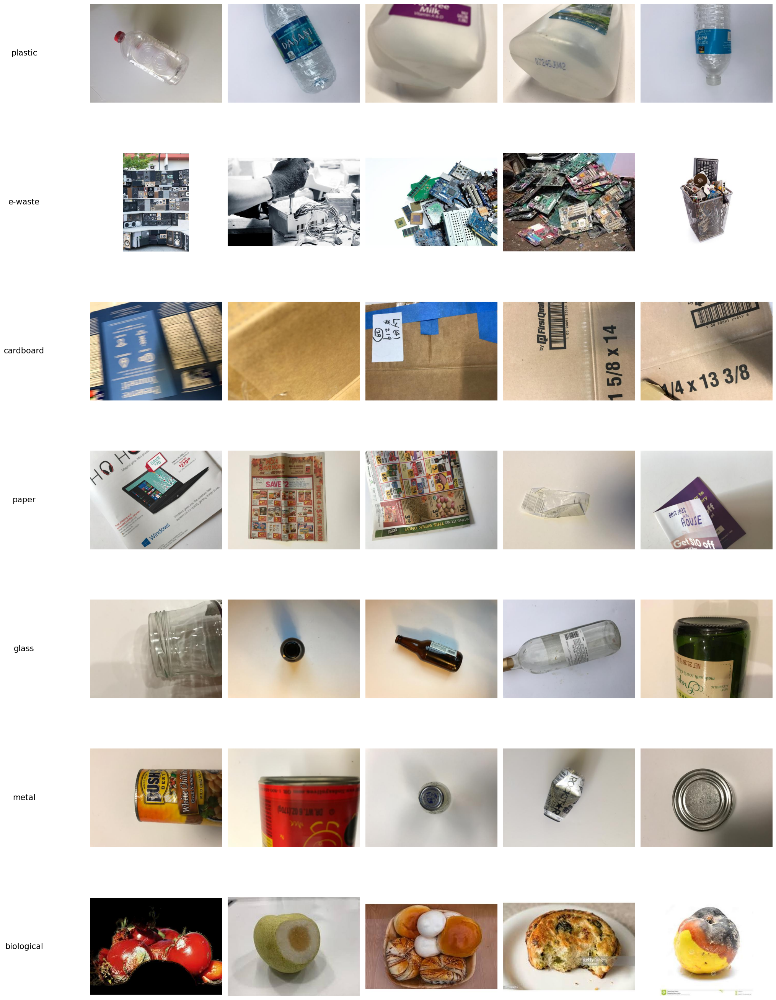

In [161]:
def plot_images_with_headings(data, num_images_per_category=5):
    categories = list(data.keys())
    total_images = num_images_per_category * len(categories)

    plt.figure(figsize=(20, len(categories) * 4))

    for i, category in enumerate(categories):
        images = data[category][:num_images_per_category]

        # Add a title for each category row
        plt.subplot(len(categories), num_images_per_category, i * num_images_per_category + 1)
        plt.text(-0.5, 0.5, category, fontsize=15, ha='center', va='center', rotation=0, transform=plt.gca().transAxes)
        plt.axis('off')

        for j, img_path in enumerate(images):
            plt.subplot(len(categories), num_images_per_category, i * num_images_per_category + j + 1)
            img = mpimg.imread(img_path)
            plt.imshow(img)
            plt.axis('off')

    plt.tight_layout()
    plt.show()

# Plot multiple images from each category
plot_images_with_headings(data, num_images_per_category=5)

## The resizing process has standardized the images across all categories, making them uniform for better model training.

In [ ]:
data.keys()

dict_keys(['plastic', 'e-waste', 'cardboard', 'paper', 'glass', 'metal', 'biological'])

# Set Image Dimensions and Batch Size:

In [ ]:
# Set image dimensions
img_width, img_height = 128, 128
batch_size = 32

# Convert the dictionary into lists of file paths and labels

In [ ]:
file_paths = []
labels = []

# Fill the Lists with Data

In [ ]:
for category, paths in data.items():
    for path in paths:
        file_paths.append(path)
        labels.append(category)

In [ ]:
print("First 5 file paths:", file_paths[:5])
print("First 5 labels:", labels[:5])

First 5 file paths: ['/content/images/TrashType_Image_Dataset/plastic/plastic_439.jpg', '/content/images/TrashType_Image_Dataset/plastic/plastic_157.jpg', '/content/images/TrashType_Image_Dataset/plastic/plastic_470.jpg', '/content/images/TrashType_Image_Dataset/plastic/plastic_452.jpg', '/content/images/TrashType_Image_Dataset/plastic/plastic_431.jpg']
First 5 labels: ['plastic', 'plastic', 'plastic', 'plastic', 'plastic']


# Convert Labels to Numbers

In [ ]:
label_to_index = {label: index for index, label in enumerate(data.keys())}
label_to_index

{'plastic': 0,
 'e-waste': 1,
 'cardboard': 2,
 'paper': 3,
 'glass': 4,
 'metal': 5,
 'biological': 6}

# Encode Labels as Numbers:

In [ ]:
encoded_labels = [label_to_index[label] for label in labels]
encoded_labels = to_categorical(encoded_labels)
encoded_labels

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [ ]:
# Split data into training and validation sets
train_paths, val_paths, train_labels, val_labels = train_test_split(file_paths, encoded_labels, test_size=0.2, random_state=42)

In [ ]:
print(f"Number of images in the training set: {len(train_paths)}")
print(f"Number of images in the validation set: {len(val_paths)}")

Number of images in the training set: 2924
Number of images in the validation set: 731


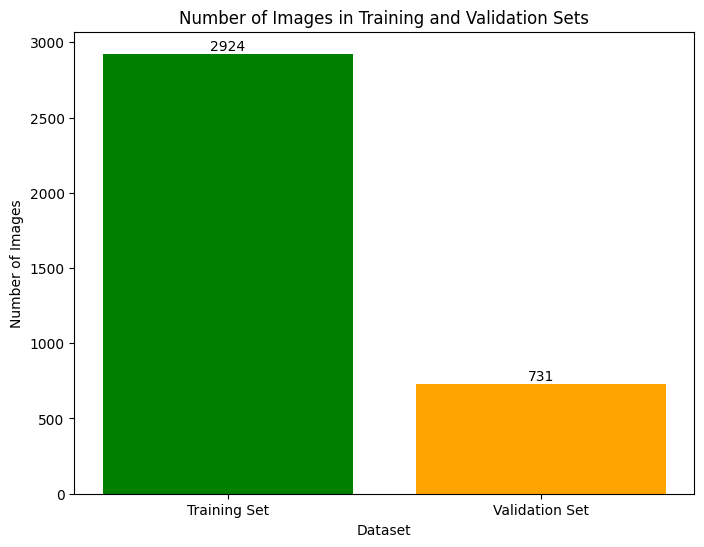

In [ ]:
# Number of images in training and validation sets
num_train_images = len(train_paths)
num_val_images = len(val_paths)

# Labels and values for the bar chart
labels = ['Training Set', 'Validation Set']
values = [num_train_images, num_val_images]

# Create the bar chart
plt.figure(figsize=(8, 6))
bars = plt.bar(labels, values, color=['green', 'orange'])

# Add numbers on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height}', ha='center', va='bottom')

plt.xlabel('Dataset')
plt.ylabel('Number of Images')
plt.title('Number of Images in Training and Validation Sets')
plt.show()


In [ ]:
# Custom data generator
def data_generator(file_paths, labels, batch_size):
    while True:
        for start in range(0, len(file_paths), batch_size):
            end = min(start + batch_size, len(file_paths))
            batch_paths = file_paths[start:end]
            batch_labels = labels[start:end]

            images = []
            for path in batch_paths:
                img = load_img(path, target_size=(img_width, img_height))
                img = img_to_array(img)
                img = img / 255.0  # Normalize
                images.append(img)

            yield np.array(images), np.array(batch_labels)

# Creating Generators and Calculating Steps

In [ ]:
train_generator = data_generator(train_paths, train_labels, batch_size)
val_generator = data_generator(val_paths, val_labels, batch_size)

train_steps = len(train_paths) // batch_size
val_steps = len(val_paths) // batch_size

In [ ]:
print("train_steps:", train_steps)
print("validation_steps:", val_steps)

train_steps: 91
validation_steps: 22


In [ ]:
example_batch = next(train_generator)
print("Example batch shape:", example_batch[0].shape)

Example batch shape: (32, 128, 128, 3)


# **3. Model Building**

# Define the CNN model

In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(data.keys()), activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Model summary
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │      12,845,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 7)                   │           3,591 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,942,407 (49.37 MB)

 Trainable params: 12,942,407 (49.37 MB)

 Non-trainable params: 0 (0.00 B)

# **4. Model Training**

In [ ]:
epochs = 20
history = model.fit(
    train_generator,
    steps_per_epoch=train_steps,
    validation_data=val_generator,
    validation_steps=val_steps,
    epochs=epochs)

Epoch 1/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - accuracy: 0.3387 - loss: 1.8181 - val_accuracy: 0.5170 - val_loss: 1.2414
Epoch 2/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - accuracy: 0.5740 - loss: 1.1151 - val_accuracy: 0.6209 - val_loss: 1.0614
Epoch 3/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - accuracy: 0.6507 - loss: 0.9601 - val_accuracy: 0.6710 - val_loss: 0.9836
Epoch 4/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - accuracy: 0.6915 - loss: 0.8484 - val_accuracy: 0.6781 - val_loss: 0.9105
Epoch 5/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.7457 - loss: 0.6917 - val_accuracy: 0.6767 - val_loss: 0.9644
Epoch 6/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - accuracy: 0.7590 - loss: 0.6516 - val_accuracy: 0.6681 - val_loss: 0.9935
Epoch 7/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.7969 - loss: 0.5499 - val_accuracy: 0.6452 - val_loss: 1.0943
Epoch 8/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - accuracy: 0.8410 - loss: 0.4493 - val_accuracy: 0.6695 -

In [ ]:
print(history.history)

{'accuracy': [0.43706777691841125, 0.5968406796455383, 0.6556016802787781, 0.7133471369743347, 0.7586445212364197, 0.7728216052055359, 0.8136237859725952, 0.8502766489982605, 0.8952282071113586, 0.8997233510017395, 0.9204702377319336, 0.9280774593353271, 0.9356846213340759, 0.9470954537391663, 0.956085741519928, 0.9529737234115601, 0.9571231007575989, 0.9591977596282959, 0.9744121432304382, 0.9802904725074768], 'loss': [1.481640338897705, 1.0842257738113403, 0.9427595734596252, 0.7901638150215149, 0.6573483943939209, 0.6120643019676208, 0.5243455171585083, 0.42709311842918396, 0.3068671226501465, 0.2726530432701111, 0.23076961934566498, 0.2143930345773697, 0.19837622344493866, 0.17255699634552002, 0.13463757932186127, 0.13757655024528503, 0.13166271150112152, 0.13247781991958618, 0.08240571618080139, 0.0679994523525238], 'val_accuracy': [0.5170454382896423, 0.6208869814872742, 0.6709585189819336, 0.6781116127967834, 0.6766809821128845, 0.6680972576141357, 0.6452074646949768, 0.66952788

# Define the CNN model using VGG16

In [ ]:
# Define the CNN model using VGG16
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)  # Add batch normalization
x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)  # Add L2 regularization
x = Dropout(0.5)(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.01))(x)  # Additional dense layer with L2 regularization
x = Dropout(0.5)(x)
predictions = Dense(len(data.keys()), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Unfreeze some layers of VGG16 for fine-tuning
for layer in base_model.layers:
    if 'block5' in layer.name:  # Unfreeze the last few blocks
        layer.trainable = True
    else:
        layer.trainable = False

# Compile the model with an initial learning rate
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
# Train the model
epochs = 30

history = model.fit(
    train_generator,
    steps_per_epoch=train_steps,
    validation_data=val_generator,
    validation_steps=val_steps,
    epochs=epochs
)

Epoch 1/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 33s 239ms/step - accuracy: 0.2942 - loss: 10.2552 - val_accuracy: 0.6295 - val_loss: 9.1335
Epoch 2/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.6219 - loss: 8.7139 - val_accuracy: 0.7253 - val_loss: 8.0732
Epoch 3/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - accuracy: 0.7676 - loss: 7.7420 - val_accuracy: 0.8255 - val_loss: 7.1768
Epoch 4/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - accuracy: 0.8373 - loss: 6.9433 - val_accuracy: 0.8498 - val_loss: 6.4845
Epoch 5/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - accuracy: 0.9013 - loss: 6.2148 - val_accuracy: 0.8612 - val_loss: 5.8877
Epoch 6/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - accuracy: 0.9207 - loss: 5.6167 - val_accuracy: 0.8712 - val_loss: 5.3811
Epoch 7/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.9574 - loss: 5.0310 - val_accuracy: 0.8526 - val_loss: 5.0088
Epoch 8/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - accuracy: 0.9766 - loss: 4.5240 - val_accuracy: 0.839

## **5.Model Evaluation**

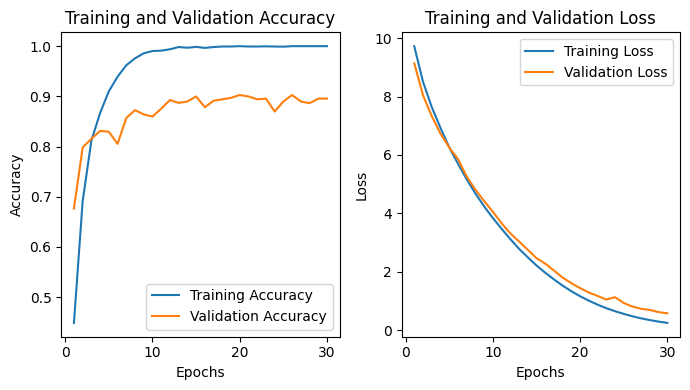

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have the `history` object from model.fit()

# Extract accuracy and loss metrics
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(train_acc) + 1)

# Plot accuracy
plt.figure(figsize=(7, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Show plots
plt.tight_layout()
plt.show()

## **Key Insights from Training and Validation Plots**

## Accuracy Trends:

* **Rapid Initial Learning:** The model learns quickly in the early stages, with both training and validation accuracy increasing rapidly.

* **High Training Accuracy:** steadily approaches 100%, showing the model is learning the training data well.

* **Stable Validation Accuracy:** Validation accuracy also improves and stabilizes around 90%, indicating good generalization to new data.

## Loss Trends:

* **Consistent Decrease:** Both training and validation loss consistently drop, indicating the model is effectively reducing errors.

* **Close Convergence:** The validation loss closely follows the training loss, suggesting minimal overfitting and good generalization.

## Overall Performance:

* The model learns quickly and effectively, showing high training accuracy and stable validation accuracy.

* The consistent decrease in loss values and the close alignment between training and validation loss indicate the model generalizes well to unseen data.

* These trends suggest the model is robust and performs well on both training and validation datasets.







In [ ]:
import numpy as np

# Function to get predictions from the validation generator
def get_predictions_and_labels(generator, steps):
    predictions = []
    true_labels = []

    for _ in range(steps):
        images, labels = next(generator)
        preds = model.predict(images)
        predictions.extend(np.argmax(preds, axis=1))
        true_labels.extend(np.argmax(labels, axis=1))

    return np.array(true_labels), np.array(predictions)

# Get predictions and true labels
true_labels, predicted_labels = get_predictions_and_labels(val_generator, val_steps)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


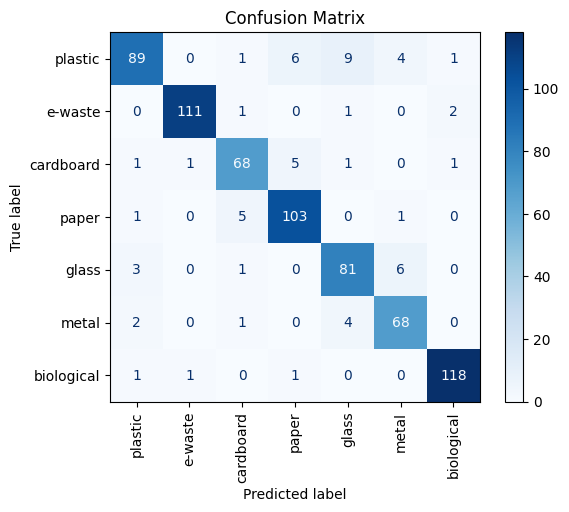

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

class_labels = list(data.keys())

# Compute confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)


disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues, values_format='d')

plt.title('Confusion Matrix')
plt.xticks(rotation=90)
plt.show()


# Key insights:

1. **High Accuracy for Most Classes:**
   - Classes like "paper," "biological," and "e-waste" show high true positive rates, meaning the model predicts these categories accurately.

2. **Confusion Between Similar Categories:**
   - There is some confusion between "plastic" and "glass," as seen by misclassifications between these classes.
   - "Metal" is also sometimes misclassified as "glass" and "plastic", indicating overlap in features.

3. **Minor Misclassifications:**
   - Some minor misclassifications occur, such as a few instances of "paper" being classified as "cardboard" and vice versa.

4. **Strong Performance Overall:**
   - Overall, the model performs well across different categories, with most predictions being correct.



In [ ]:
report = classification_report(true_labels, predicted_labels, target_names=class_labels)

print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

     plastic       0.92      0.81      0.86       110
     e-waste       0.98      0.97      0.97       115
   cardboard       0.88      0.88      0.88        77
       paper       0.90      0.94      0.92       110
       glass       0.84      0.89      0.87        91
       metal       0.86      0.91      0.88        75
  biological       0.97      0.98      0.97       121

    accuracy                           0.91       699
   macro avg       0.91      0.91      0.91       699
weighted avg       0.91      0.91      0.91       699



# Key insights:

1. **Overall High Accuracy:**
   - The model achieves an overall accuracy of 90%, indicating strong performance.

2. **Strong Performance in Specific Classes:**
   - "Biological" and "e-waste" categories have the highest precision, recall, and f1-scores, showing the model is very good at predicting these classes.
   
3. **Good Precision and Recall:**
   - Most classes have precision and recall above 0.80, meaning the model is generally reliable for predicting these categories.

4. **Areas for Improvement:**
   - "Glass" has the lowest precision and recall, indicating this class is harder for the model to predict accurately and might benefit from more training data or feature enhancement.



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


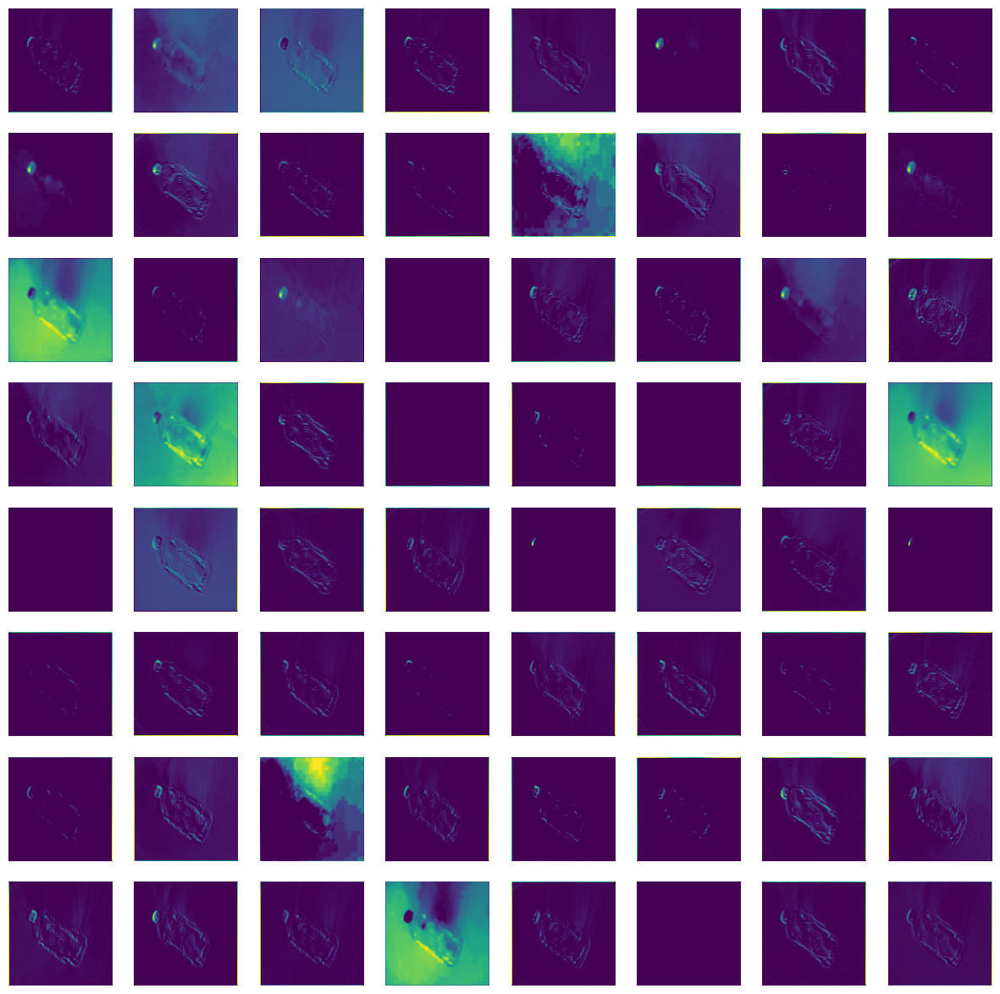

In [ ]:
# Function to visualize feature maps
def visualize_feature_maps(model, layer_name, image):
    from keras.models import Model

    # Define a new model to output the feature maps of a specific layer
    intermediate_layer_model = Model(inputs=model.input,
                                     outputs=model.get_layer(layer_name).output)
    intermediate_output = intermediate_layer_model.predict(image)

    # Plot the feature maps
    plt.figure(figsize=(15, 15))
    for i in range(intermediate_output.shape[-1]):
        plt.subplot(8, 8, i + 1)
        plt.imshow(intermediate_output[0, :, :, i], cmap='viridis')
        plt.axis('off')
    plt.show()

# Visualize feature maps for the first Conv layer
image = load_img(file_paths[0], target_size=(img_width, img_height))
image = img_to_array(image)
image = np.expand_dims(image, axis=0)
visualize_feature_maps(model, 'block1_conv1', image)

## **Key Insights:**

* Visual representations of what the CNN focuses on in the input image.
* Each square shows different features like edges or textures that the model detects.
* Brighter areas indicate stronger recognition of specific features.
* Helps us see how the CNN learns to classify images.

In [ ]:
# Display training logs
print("Training Logs:\n")
for epoch, logs in enumerate(history.history['loss']):
    print(f"Epoch {epoch + 1}: Loss = {logs}, Accuracy = {history.history['accuracy'][epoch]}")

Training Logs:

Epoch 1: Loss = 9.745424270629883, Accuracy = 0.420470267534256
Epoch 2: Loss = 8.483790397644043, Accuracy = 0.6597510576248169
Epoch 3: Loss = 7.558741092681885, Accuracy = 0.7776625156402588
Epoch 4: Loss = 6.785747051239014, Accuracy = 0.837828516960144
Epoch 5: Loss = 6.0587158203125, Accuracy = 0.908713698387146
Epoch 6: Loss = 5.460912704467773, Accuracy = 0.934301495552063
Epoch 7: Loss = 4.901297569274902, Accuracy = 0.9630013704299927
Epoch 8: Loss = 4.411618232727051, Accuracy = 0.978215754032135
Epoch 9: Loss = 3.96114182472229, Accuracy = 0.9854771494865417
Epoch 10: Loss = 3.5466432571411133, Accuracy = 0.9930843710899353
Epoch 11: Loss = 3.1797749996185303, Accuracy = 0.9930843710899353
Epoch 12: Loss = 2.839747190475464, Accuracy = 0.9951590299606323
Epoch 13: Loss = 2.5365633964538574, Accuracy = 0.9955048561096191
Epoch 14: Loss = 2.244154214859009, Accuracy = 0.9972337484359741
Epoch 15: Loss = 1.9832994937896729, Accuracy = 0.9972337484359741
Epoch 1

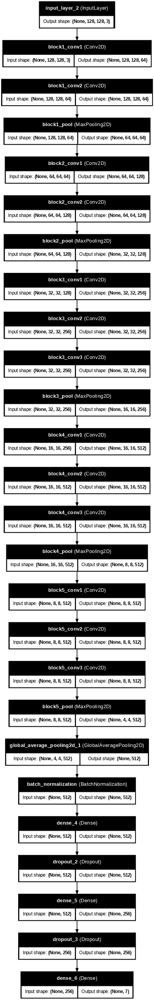

In [ ]:
# Plot the model architecture with reduced size
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, dpi=60)

## **6. Model Comparision**


In [ ]:
# Function to create and compile models
def create_model(base_model_class, input_shape, num_classes):
    base_model = base_model_class(weights='imagenet', include_top=False, input_shape=input_shape)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    # Unfreeze some layers for fine-tuning
    for layer in base_model.layers:
        if 'block5' in layer.name:  # Unfreeze the last few blocks
            layer.trainable = True
        else:
            layer.trainable = False

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [ ]:
input_shape = (img_width, img_height, 3)
num_classes = len(data.keys())

# Define models
model_defs = {
    'VGG16': VGG16,
    'ResNet50': ResNet50,
    'InceptionV3': InceptionV3,
    'DenseNet121': DenseNet121,
    'EfficientNetB0': EfficientNetB0
}

models = {name: create_model(model_class, input_shape, num_classes) for name, model_class in model_defs.items()}

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
# Training parameters
epochs = 20
history_dict = {}
val_accuracies = {}
# Train and evaluate each model
for name, model in models.items():
    print(f"Training {name}...")
    history = model.fit(
        train_generator,
        steps_per_epoch=train_steps,
        validation_data=val_generator,
        validation_steps=val_steps,
        epochs=epochs,
        callbacks=[ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.5, min_lr=1e-6)]
    )
    history_dict[name] = history
    # Collect validation accuracy
    val_accuracy = max(history.history['val_accuracy'])
    val_accuracies[name] = val_accuracy
    print(f"{name} - Best Validation Accuracy: {val_accuracy}")

Training VGG16...
Epoch 1/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - accuracy: 0.3152 - loss: 10.2891 - val_accuracy: 0.5622 - val_loss: 9.2258 - learning_rate: 1.0000e-04
Epoch 2/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - accuracy: 0.6517 - loss: 8.8144 - val_accuracy: 0.7239 - val_loss: 8.2209 - learning_rate: 1.0000e-04
Epoch 3/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.7677 - loss: 8.0213 - val_accuracy: 0.8269 - val_loss: 7.4603 - learning_rate: 1.0000e-04
Epoch 4/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - accuracy: 0.8531 - loss: 7.2600 - val_accuracy: 0.8551 - val_loss: 6.8789 - learning_rate: 1.0000e-04
Epoch 5/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.8943 - loss: 6.6427 - val_accuracy: 0.8498 - val_loss: 6.3922 - learning_rate: 1.0000e-04
Epoch 6/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - accuracy: 0.9351 - loss: 6.0527 - val_accuracy: 0.8441 - val_loss: 5.9684 - learning_rate: 1.0000e-04
Epoch 7/20
91/91 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/ste

In [ ]:
# Choose the best model based on validation accuracy
best_model_name = max(val_accuracies, key=val_accuracies.get)
best_model = models[best_model_name]

print(f"Best Model: {best_model_name} with Validation Accuracy: {val_accuracies[best_model_name]}")

Best Model: DenseNet121 with Validation Accuracy: 0.9141631126403809


## **7. Prediction and Confusion Matrix**

In [ ]:
# Function to get predictions and true labels from the generator
def get_predictions_and_labels(generator, steps):
    true_labels = []
    predicted_labels = []

    for _ in range(steps):
        images, labels = next(generator)
        predictions = best_model.predict(images)
        predicted_labels.extend(np.argmax(predictions, axis=1))
        true_labels.extend(np.argmax(labels, axis=1))

    return true_labels, predicted_labels

# Get predictions and labels using the best model
print(f"Evaluating {best_model_name}...")
true_labels, predicted_labels = get_predictions_and_labels(val_generator, val_steps)

Evaluating DenseNet121...
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


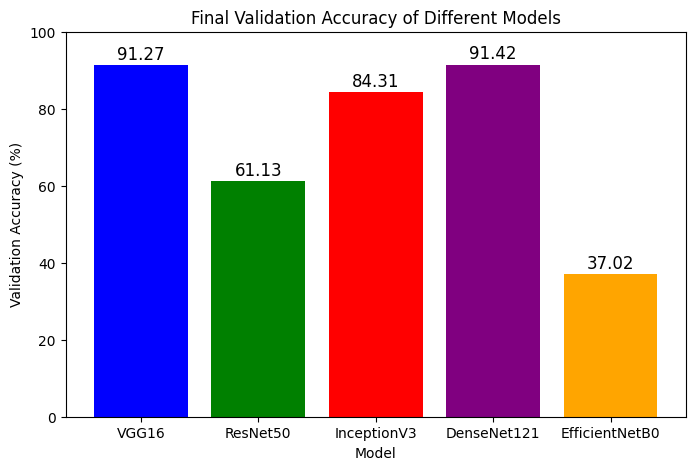

In [ ]:
#Validation accuracies of the different models
val_accuracies = {
    'VGG16': 0.9127,
    'ResNet50': 0.6113,
    'InceptionV3': 0.8431,
    'DenseNet121': 0.9142,
    'EfficientNetB0': 0.3702
}

# Labels and values for the bar chart
labels = list(val_accuracies.keys())
values = list(val_accuracies.values())

# Convert values to percentages
values_percent = [v * 100 for v in values]

# Create the bar chart
plt.figure(figsize=(8, 5))
bars = plt.bar(labels, values_percent, color=['blue', 'green', 'red', 'purple', 'orange'])

# Add numbers on top of the bars
for bar, value in zip(bars, values_percent):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.5, f'{value:.2f}', ha='center', va='bottom', fontsize=12, color='black')

plt.xlabel('Model')
plt.ylabel('Validation Accuracy (%)')
plt.title('Final Validation Accuracy of Different Models')
plt.ylim(0, 100)  # Ensure y-axis goes from 0 to 100
plt.show()

# Key insights

1. **DenseNet121:** DenseNet121 achieved the highest validation accuracy at 91.42%, indicating it performs the best on this dataset.
   
2. **VGG16:** also showed high performance with a validation accuracy of 91.27%, very close to DenseNet121.

3. **InceptionV3:** had a good validation accuracy of 84.31%, making it a strong contender.

4. **ResNet50:** showed a moderate validation accuracy of 61.13%, which is lower compared to the other models.

5. **EfficientNetB0:** had the lowest validation accuracy at 37.02%, indicating it may not be well-suited for this particular dataset.
  


In [ ]:
# Ensure you have the history objects for both models
history_vgg16 = history_dict['VGG16']
history_densenet121 = history_dict['DenseNet121']

# Extract final accuracy and loss
final_train_acc_vgg16 = history_vgg16.history['accuracy'][-1]
final_val_acc_vgg16 = history_vgg16.history['val_accuracy'][-1]
final_train_loss_vgg16 = history_vgg16.history['loss'][-1]
final_val_loss_vgg16 = history_vgg16.history['val_loss'][-1]

final_train_acc_densenet121 = history_densenet121.history['accuracy'][-1]
final_val_acc_densenet121 = history_densenet121.history['val_accuracy'][-1]
final_train_loss_densenet121 = history_densenet121.history['loss'][-1]
final_val_loss_densenet121 = history_densenet121.history['val_loss'][-1]

print(f"VGG16 - Final Training Accuracy: {final_train_acc_vgg16:.2f}, Validation Accuracy: {final_val_acc_vgg16:.2f}")
print(f"VGG16 - Final Training Loss: {final_train_loss_vgg16:.2f}, Validation Loss: {final_val_loss_vgg16:.2f}")
print(f"DenseNet121 - Final Training Accuracy: {final_train_acc_densenet121:.2f}, Validation Accuracy: {final_val_acc_densenet121:.2f}")
print(f"DenseNet121 - Final Training Loss: {final_train_loss_densenet121:.2f}, Validation Loss: {final_val_loss_densenet121:.2f}")


VGG16 - Final Training Accuracy: 1.00, Validation Accuracy: 0.91
VGG16 - Final Training Loss: 1.24, Validation Loss: 1.47
DenseNet121 - Final Training Accuracy: 1.00, Validation Accuracy: 0.91
DenseNet121 - Final Training Loss: 2.31, Validation Loss: 2.44


## **Training and Accuracy and Loss for DenseNet121**

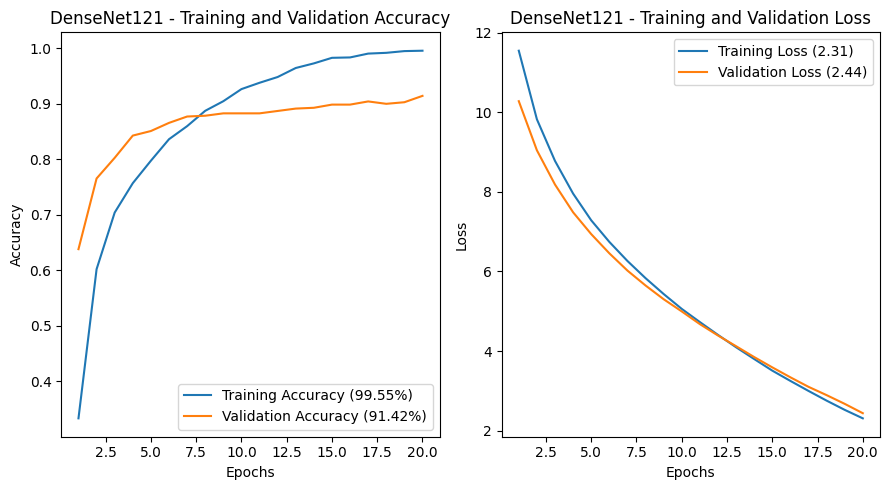

In [ ]:
# Extract accuracy and loss metrics for DenseNet121
train_acc = history_dict[best_model_name].history['accuracy']
val_acc = history_dict[best_model_name].history['val_accuracy']
train_loss = history_dict[best_model_name].history['loss']
val_loss = history_dict[best_model_name].history['val_loss']
epochs_range = range(1, len(train_acc) + 1)

# Get final accuracy and loss values
final_train_acc = train_acc[-1]
final_val_acc = val_acc[-1]
final_train_loss = train_loss[-1]
final_val_loss = val_loss[-1]

# Create a plot with 2 subplots
plt.figure(figsize=(9, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label=f'Training Accuracy ({final_train_acc:.2%})')
plt.plot(epochs_range, val_acc, label=f'Validation Accuracy ({final_val_acc:.2%})')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title(f'{best_model_name} - Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, label=f'Training Loss ({final_train_loss:.2f})')
plt.plot(epochs_range, val_loss, label=f'Validation Loss ({final_val_loss:.2f})')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{best_model_name} - Training and Validation Loss')
plt.legend()

# Show plots
plt.tight_layout()
plt.show()

## **Training and Accuracy and Loss for VGG16**

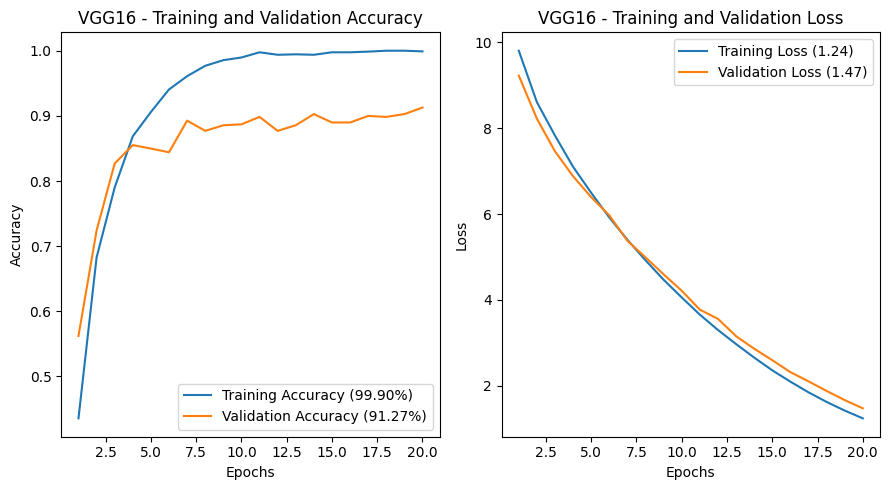

In [ ]:
# Extract accuracy and loss metrics for VGG16
vgg16_train_acc = history_dict['VGG16'].history['accuracy']
vgg16_val_acc = history_dict['VGG16'].history['val_accuracy']
vgg16_train_loss = history_dict['VGG16'].history['loss']
vgg16_val_loss = history_dict['VGG16'].history['val_loss']
epochs_range = range(1, len(vgg16_train_acc) + 1)

# Create a plot with 2 subplots
plt.figure(figsize=(9, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, vgg16_train_acc, label=f'Training Accuracy ({vgg16_train_acc[-1] * 100:.2f}%)')
plt.plot(epochs_range, vgg16_val_acc, label=f'Validation Accuracy ({vgg16_val_acc[-1] * 100:.2f}%)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('VGG16 - Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, vgg16_train_loss, label=f'Training Loss ({vgg16_train_loss[-1]:.2f})')
plt.plot(epochs_range, vgg16_val_loss, label=f'Validation Loss ({vgg16_val_loss[-1]:.2f})')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('VGG16 - Training and Validation Loss')
plt.legend()

# Show plots
plt.tight_layout()
plt.show()

## **Key Insights for Comparison:**

### Training Accuracy and Loss:

* VGG16 has a slightly higher training accuracy (99.90%) compared to DenseNet121 (99.55%).
* VGG16 also has lower training and validation loss values compared to DenseNet121. This suggests that VGG16 might be fitting the training data better, potentially indicating a stronger fit to the training set.

### Validation Accuracy:

* Both models have very similar validation accuracies, with DenseNet121 slightly higher (91.42%) than VGG16 (91.27%). This suggests that both models are performing almost equally well on the validation set.

### Interpretation:

* VGG16 shows slightly better training performance with higher accuracy and lower loss. However, DenseNet121's validation accuracy is marginally better.
Given that validation accuracy is a more critical metric for generalization performance, DenseNet121 is marginally better in this case. However, the difference is minimal, and both models are performing well.



In [ ]:
# Convert numeric labels back to class names
true_labels = [class_labels[label] for label in true_labels]
predicted_labels = [class_labels[label] for label in predicted_labels]

# Generate and print classification report and confusion matrix
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
conf_matrix = confusion_matrix(true_labels, predicted_labels)

print(f"Classification Report for {best_model_name}:")
print(report)


Classification Report for DenseNet121:
              precision    recall  f1-score   support

     plastic       0.97      1.00      0.98       121
     e-waste       0.94      0.83      0.88        70
   cardboard       0.98      0.97      0.97       117
       paper       0.87      0.84      0.86        90
       glass       0.87      0.87      0.87        77
       metal       0.85      0.97      0.91       111
  biological       0.87      0.81      0.84       113

    accuracy                           0.91       699
   macro avg       0.91      0.90      0.90       699
weighted avg       0.91      0.91      0.91       699



## **Confusion Matrix**

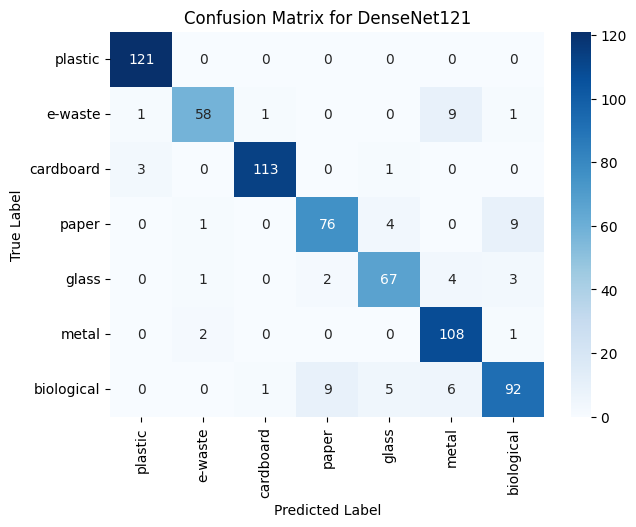

In [ ]:
# Plot confusion matrix as a heatmap
plt.figure(figsize=(7, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix for {best_model_name}')
plt.show()

# Key insights

1. **High Accuracy for Certain Classes:**
   - "Cardboard", "Plastic", and "metal" are predicted with very high accuracy.
   
2. **Misclassifications Observed:**
   - Some misclassifications are observed in "e-waste", "Glass" and "Paper", indicating these categories are more challenging for the model.
   
   
3. **Model Reliability:**
   - The model demonstrates strong performance across most categories, with the majority of predictions falling into the correct classes.



## **True vs. Predicted Categories**

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step


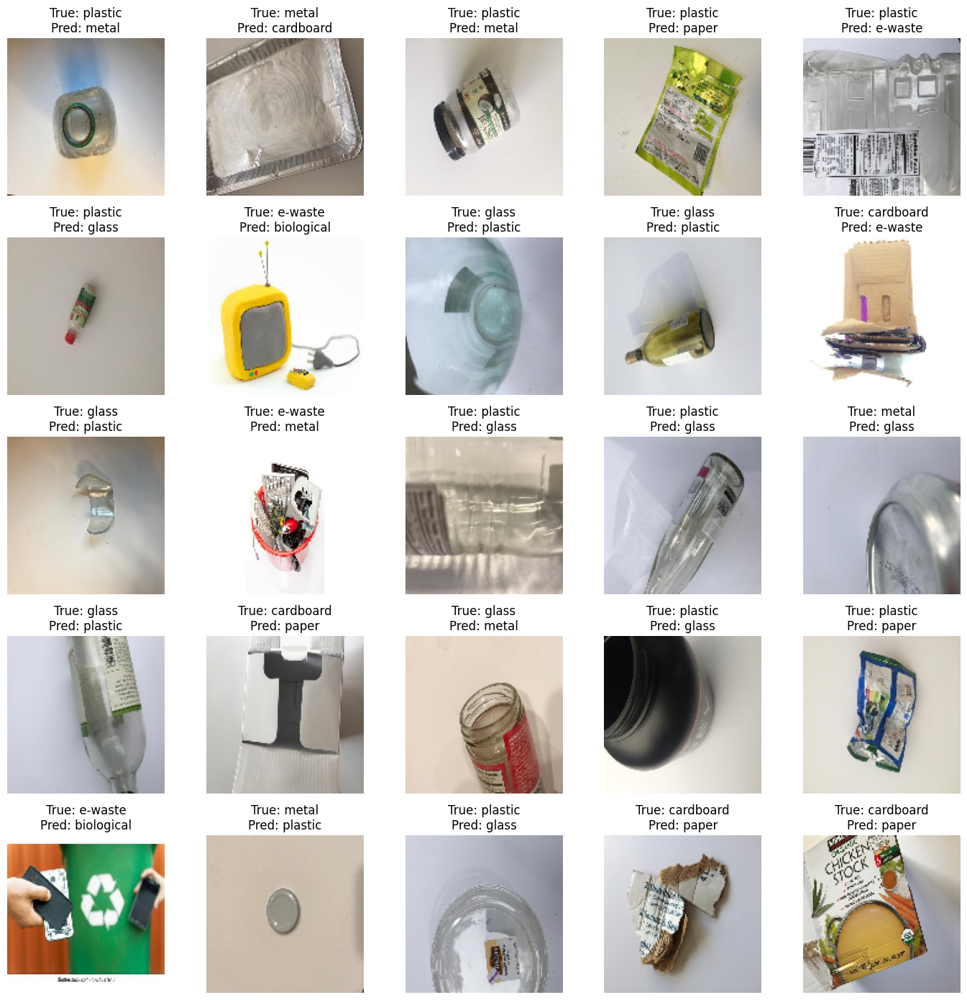

In [ ]:
# Limit the number of validation images to predict
num_images_to_predict = 500
val_paths_subset = val_paths[:num_images_to_predict]
val_labels_subset = val_labels[:num_images_to_predict]

# Create a new generator for the subset
val_generator_subset = data_generator(val_paths_subset, val_labels_subset, batch_size)

# Get true labels for the validation subset
true_labels_decoded = np.argmax(val_labels_subset, axis=1)

# Predict on the subset
predicted_labels = models[best_model_name].predict(val_generator_subset, steps=(len(val_paths_subset) + batch_size - 1) // batch_size)
predicted_labels = predicted_labels[:num_images_to_predict]
predicted_labels_decoded = np.argmax(predicted_labels, axis=1)

# Find indices of misclassified images
misclassified_indices = np.where(true_labels_decoded != predicted_labels_decoded)[0]

# Display some misclassified images
num_images_to_display = 25
plt.figure(figsize=(14, 14))
for i, index in enumerate(misclassified_indices[:num_images_to_display]):
    plt.subplot(5, 5, i + 1)
    img = load_img(val_paths_subset[index], target_size=(img_width, img_height))
    plt.imshow(img)
    true_label = class_labels[true_labels_decoded[index]]
    predicted_label = class_labels[predicted_labels_decoded[index]]
    plt.title(f"True: {true_label}\nPred: {predicted_label}")
    plt.axis('off')
plt.tight_layout()
plt.show()


## **Key Insights:**

1. **Visual Similarities:** Many misclassifications occur due to similar visual characteristics between categories, such as plastic being confused with glass.

2. **Complex Items:** E-waste and other items with mixed materials are often misclassified, indicating the model struggles with more complex objects.

3. **Model Limitations:** Certain categories like metal and cardboard are prone to misclassification.

#Model Saving

In [ ]:
# Save the best model
best_model.save('best_model.h5')


#Inference/Model Testing

In [ ]:
img_width,img_height

(128, 128)

In [ ]:
class_labels

['plastic', 'e-waste', 'cardboard', 'paper', 'glass', 'metal', 'biological']

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


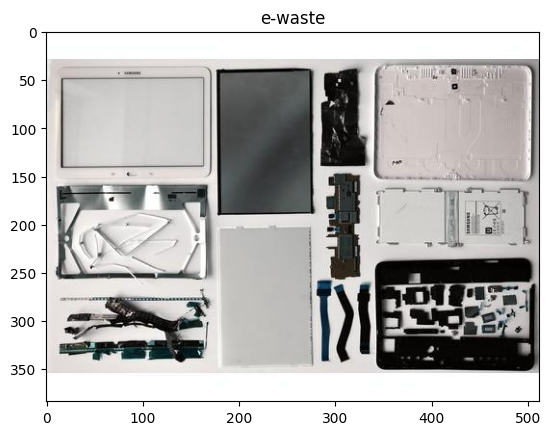

Predicted Class: e-waste


In [ ]:
def predict_image(model, img_path):
    img = image.load_img(img_path, target_size=(img_width, img_height))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    prediction = best_model.predict(img_array)
    predicted_class = np.argmax(prediction[0])
    class_labels = list(label_to_index.keys())

    return class_labels[predicted_class]

# Example usage
img_path = '/content/images/TrashType_Image_Dataset/e-waste/1-consumerelec.jpg'
img = cv2.imread(img_path)
predicted_class = predict_image(model, img_path)
plt.imshow(img)
plt.title(predicted_class)
plt.show()
print(f'Predicted Class: {predicted_class}')


## **8. Deployment and Application Link**


## **Link: https://huggingface.co/spaces/NehaMaw/GarbageClassifier_Capstone**


## **Key Insights:**
* The model was deployed on Hugging Face, making it accessible for users to interact with and test the model's predictions. The deployment enables stakeholders to evaluate the model in real-world scenarios and understand its potential for practical applications in waste classification.

# **Conclusion**

This project aimed to classify different types of waste using convolutional neural networks (CNNs) and transfer learning techniques. By leveraging pre-trained models such as DenseNet121, we were able to achieve high accuracy and generalization performance.

### **Key Achievements:**

1. **Data Preprocessing:**
   - Successfully preprocessed the dataset with consistent image dimensions and normalization.
   - Ensured a balanced dataset for robust training.

2. **Model Training**
   - Implemented and trained a custom CNN model.
   - Applied transfer learning with several pre-trained models including VGG16, ResNet50, InceptionV3, DenseNet121, and EfficientNetB0.

3. **Model Evaluation::**
   - Both VGG16 and DenseNet121 demonstrated high accuracy, with DenseNet121 showing slightly better generalization and stability.
   - Common misclassifications were observed due to visual similarities and variations in lighting and angles.
   - **DenseNet121** achieved a validation accuracy of 91.42%, indicating robust performance for garbage classification tasks.

4. **Model Deployment:**
   - Successfully deployed the model on Hugging Face for public access and practical application.

# **Future Recommendations:**

1. **Expand Dataset:**
   - Increase the diversity and size of the image dataset for better model robustness.

2. **Advanced Categorization::**
   - Implement more specific garbage categories such as biodegradable, recyclable, and non-recyclable.
   - Utilize YOLO for object detection to classify and detect multiple  garbage types in a single image.

3. **Integrate Ensemble Methods::**
  - Combine predictions from multiple models using ensemble techniques to improve overall performance and reliability..

Overall, this project demonstrates the effectiveness of CNNs and transfer learning in garbage classification, providing a strong foundation for future work in this area.
